In [1]:
import os
import numpy as np
import torch
from transformers import CLIPModel, CLIPProcessor
from sklearn.metrics.pairwise import cosine_similarity
from IPython.display import display, Image as IPyImage

e:\anaconda_set\envs\AIchallenge\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Load image features và thông tin từ file .npy
image_features = np.load('result/keyframes_features.npy')
image_info = np.load('result/keyframes_info.npy', allow_pickle=True)

image_folder = "keyframes/"

In [3]:
# # Tải mô hình CLIP và processor từ Hugging Face
# model = CLIPModel.from_pretrained('clip_model/')
# processor = CLIPProcessor.from_pretrained('clip_model/')

# Tải mô hình CLIP và processor từ Hugging Face (Sử dụng CUDA nếu có GPU)
device = "cuda" if torch.cuda.is_available() else "cpu"
model = CLIPModel.from_pretrained('clip_model/').to(device)
processor = CLIPProcessor.from_pretrained('clip_model/')

1. Cosin similarity

TOP

Rank 1: Folder 'L07_V013', Image '009' with similarity score 0.2974


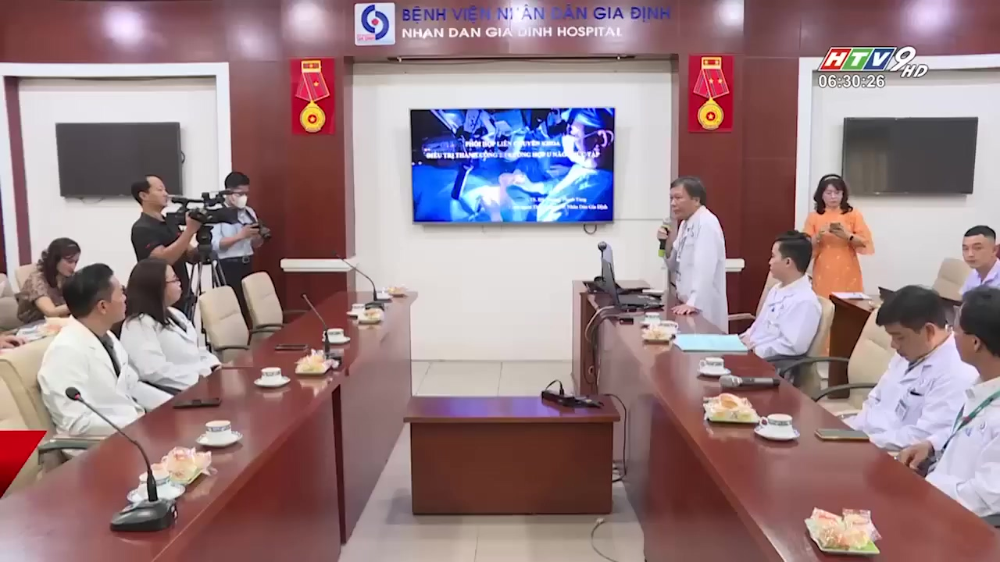

Rank 2: Folder 'L03_V030', Image '163' with similarity score 0.2927


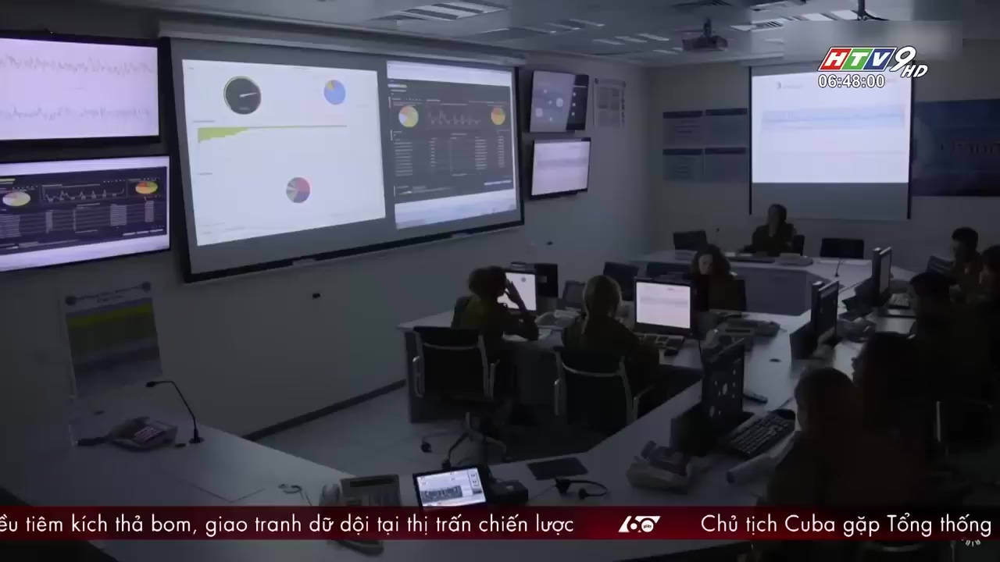

Rank 3: Folder 'L08_V011', Image '187' with similarity score 0.2898


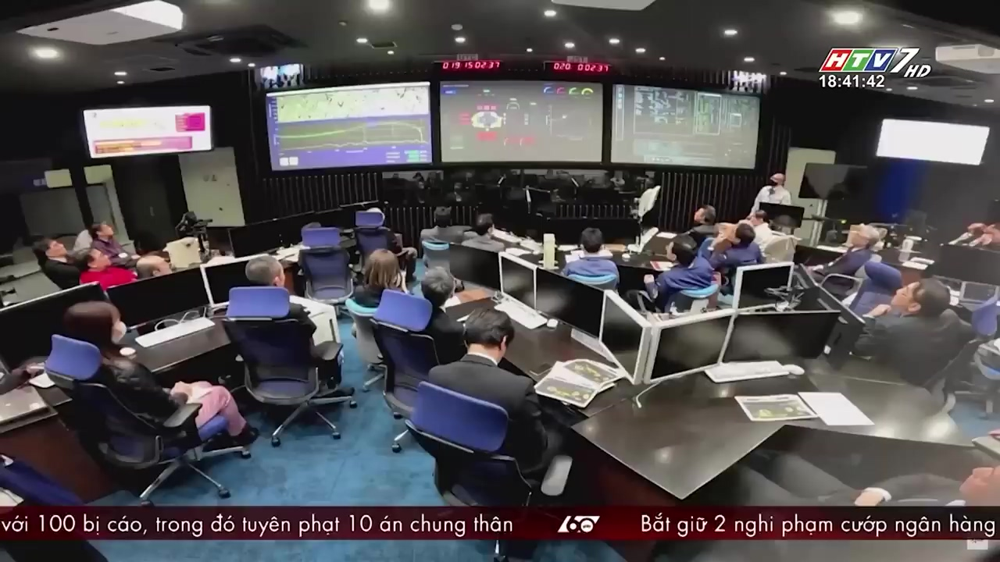

Rank 4: Folder 'L02_V010', Image '147' with similarity score 0.2896


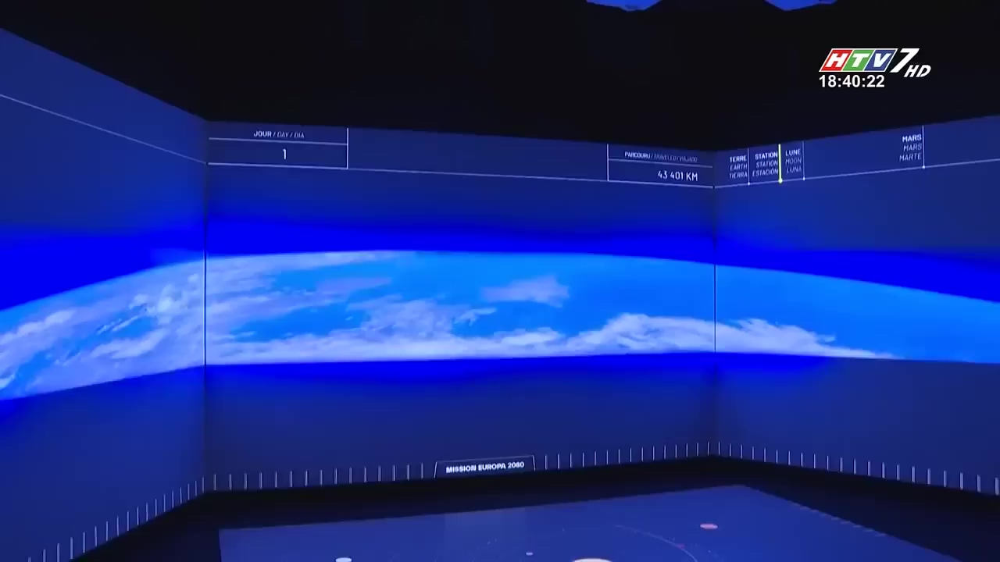

Rank 5: Folder 'L03_V030', Image '152' with similarity score 0.2895


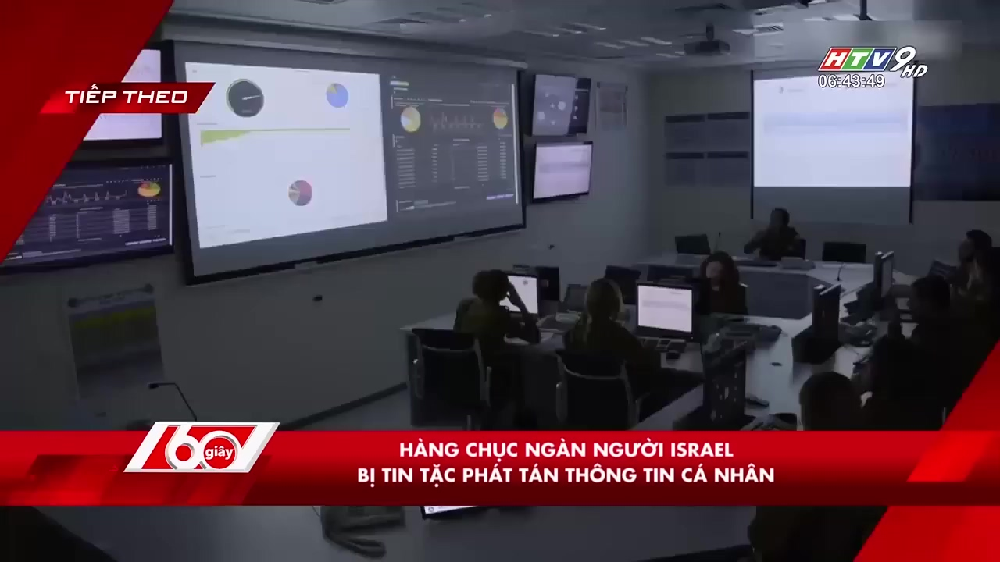

Rank 6: Folder 'L10_V006', Image '164' with similarity score 0.2849


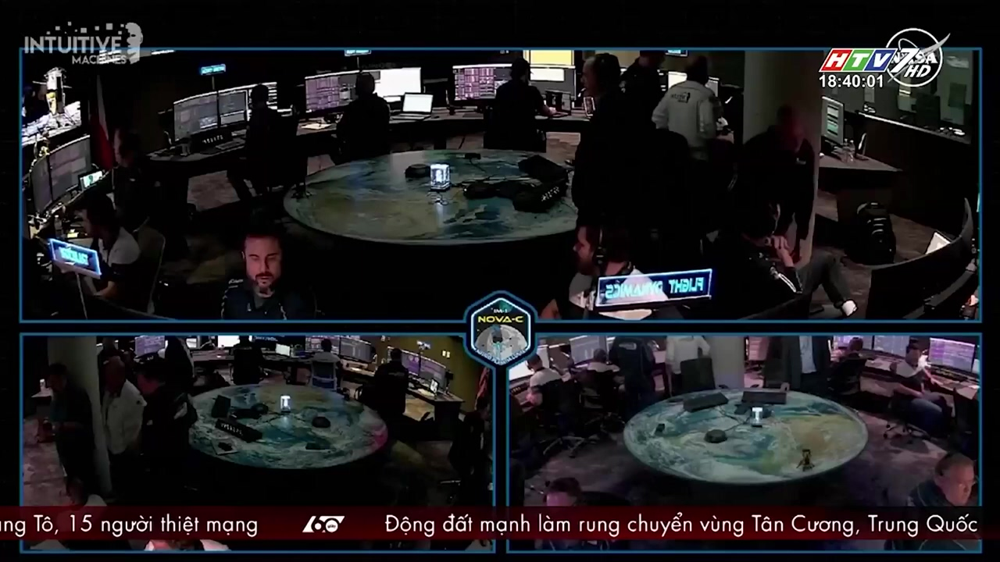

Rank 7: Folder 'L10_V007', Image '088' with similarity score 0.2841


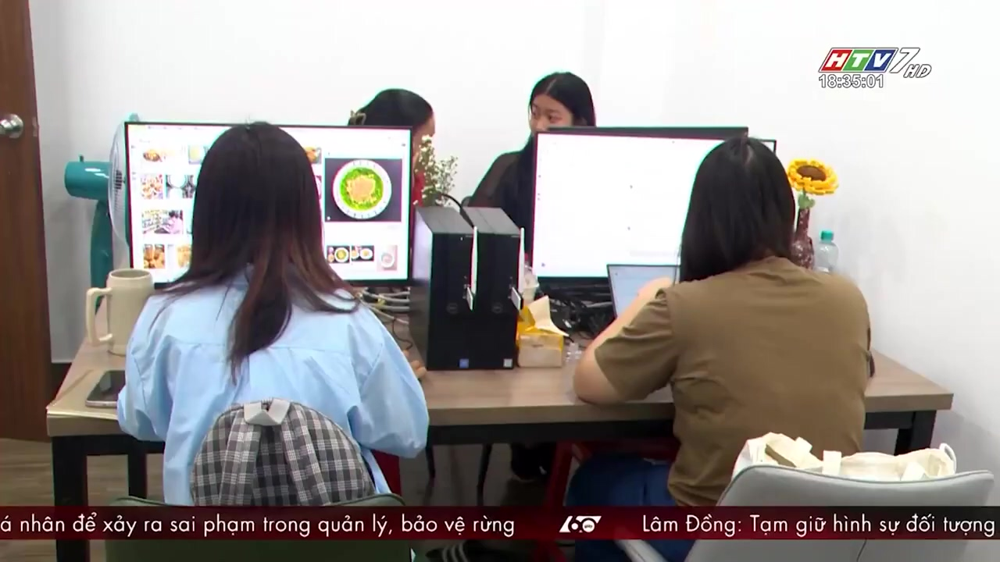

Rank 8: Folder 'L11_V027', Image '034' with similarity score 0.2839


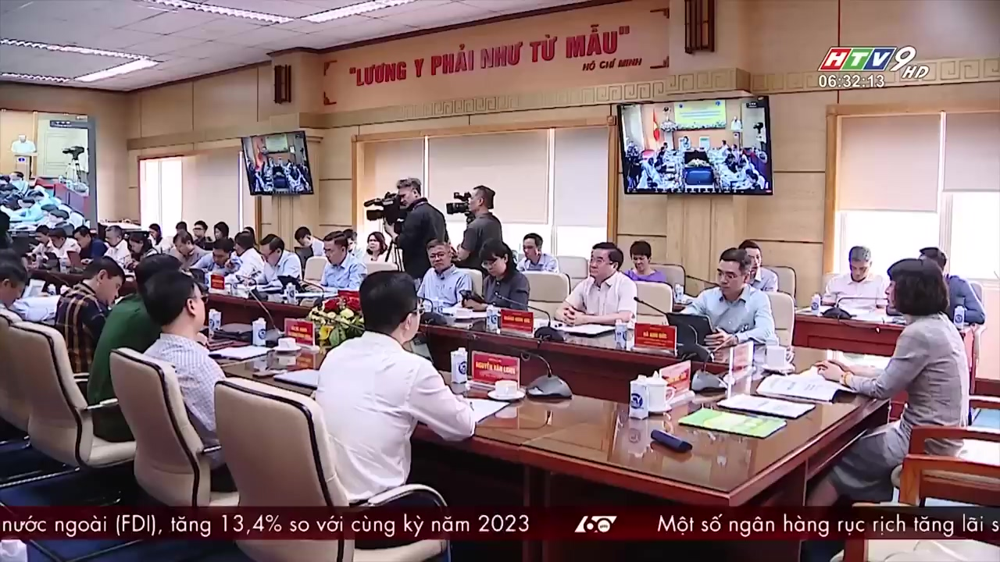

Rank 9: Folder 'L12_V001', Image '345' with similarity score 0.2784


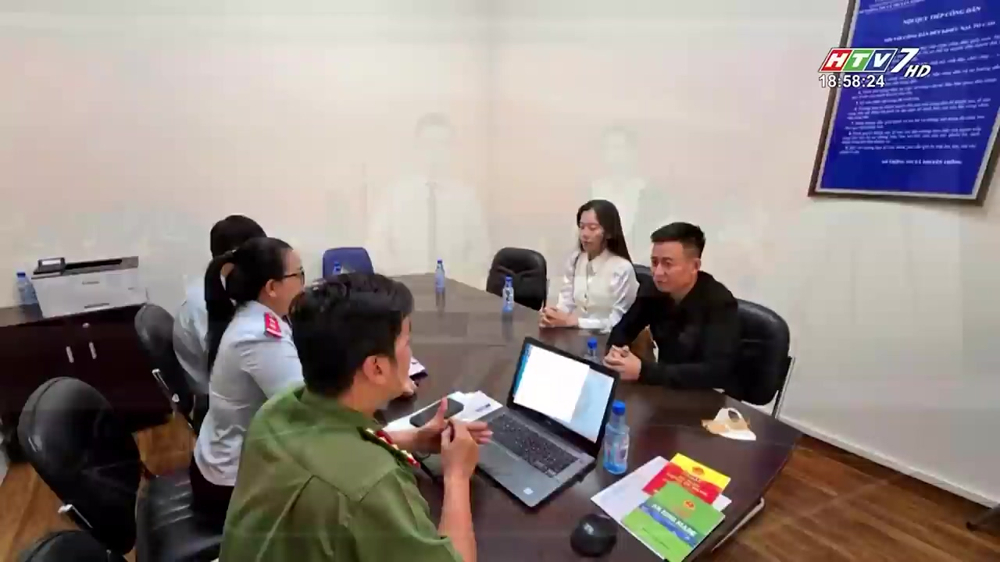

Rank 10: Folder 'L09_V016', Image '034' with similarity score 0.2780


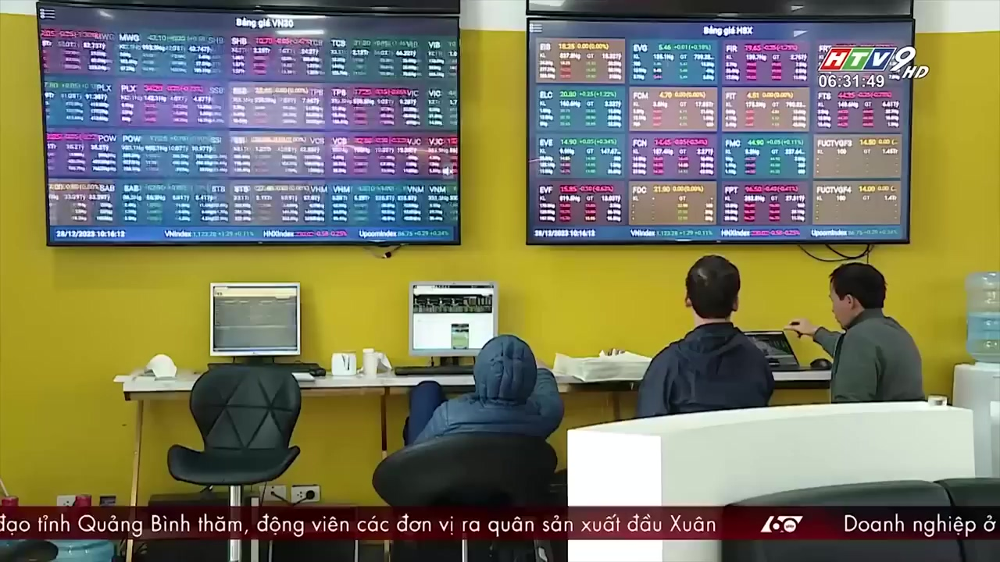

Rank 11: Folder 'L10_V010', Image '368' with similarity score 0.2772


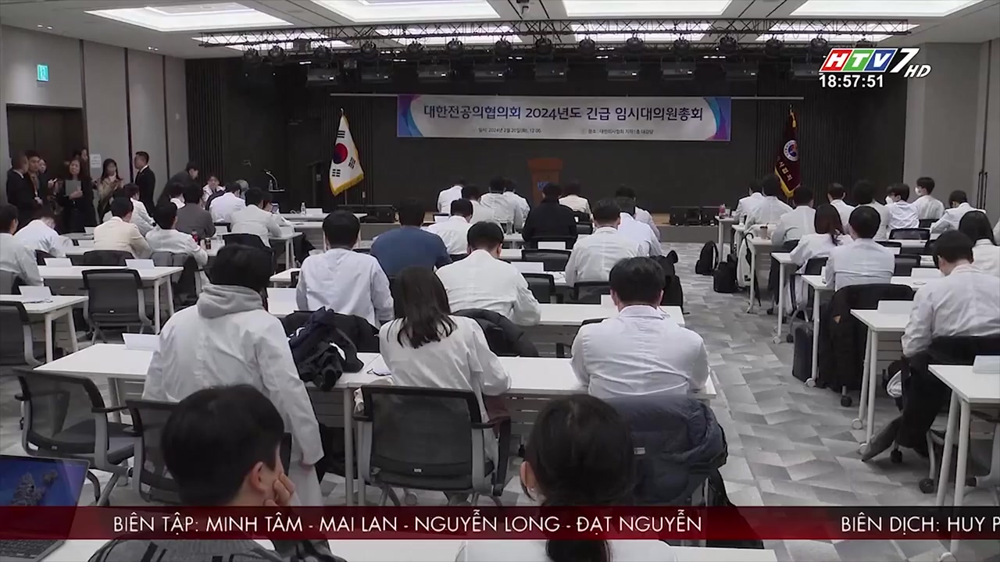

Rank 12: Folder 'L01_V019', Image '039' with similarity score 0.2758


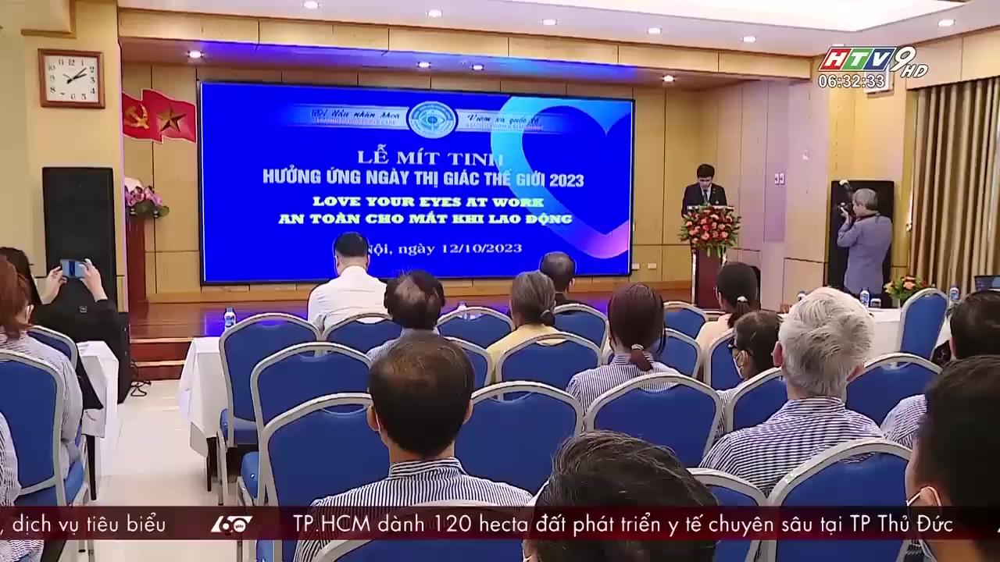

Rank 13: Folder 'L01_V003', Image '007' with similarity score 0.2749


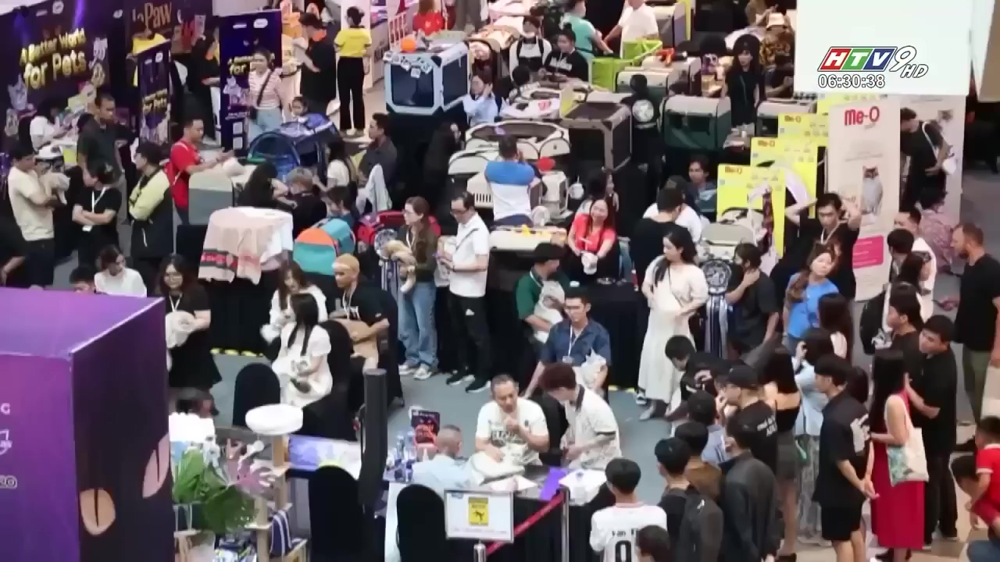

Rank 14: Folder 'L01_V024', Image '253' with similarity score 0.2746


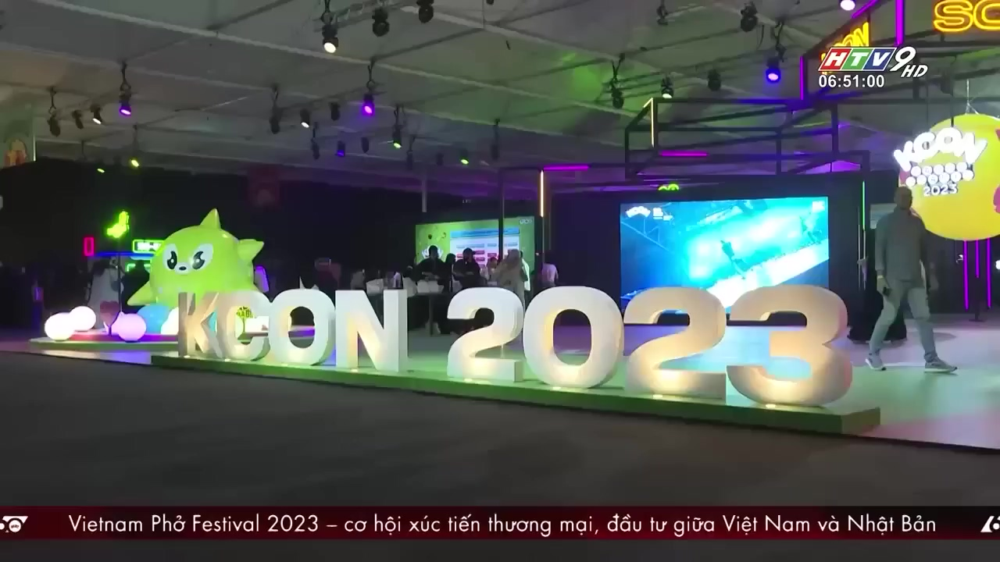

Rank 15: Folder 'L10_V007', Image '137' with similarity score 0.2741


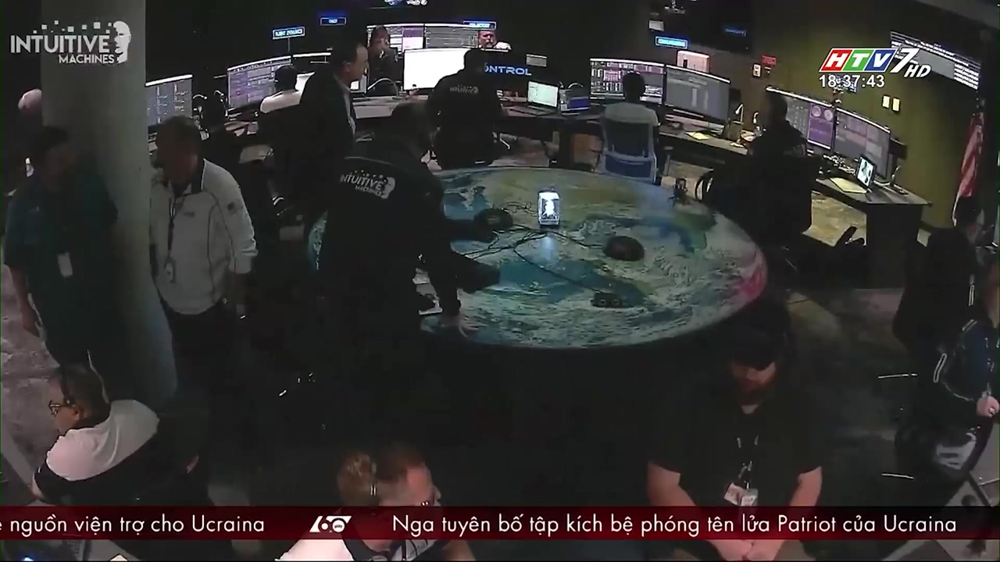

Rank 16: Folder 'L10_V010', Image '367' with similarity score 0.2737


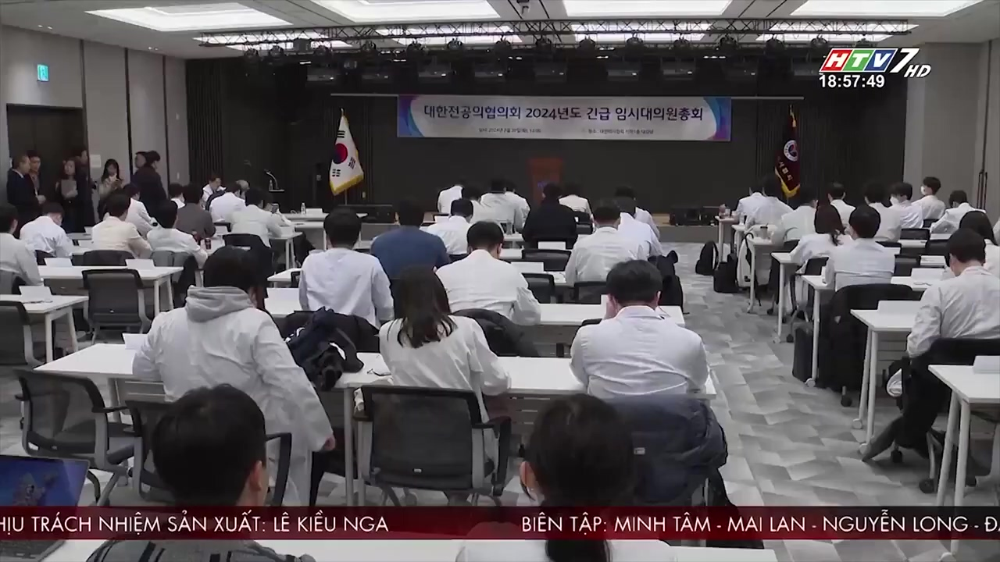

Rank 17: Folder 'L12_V030', Image '282' with similarity score 0.2735


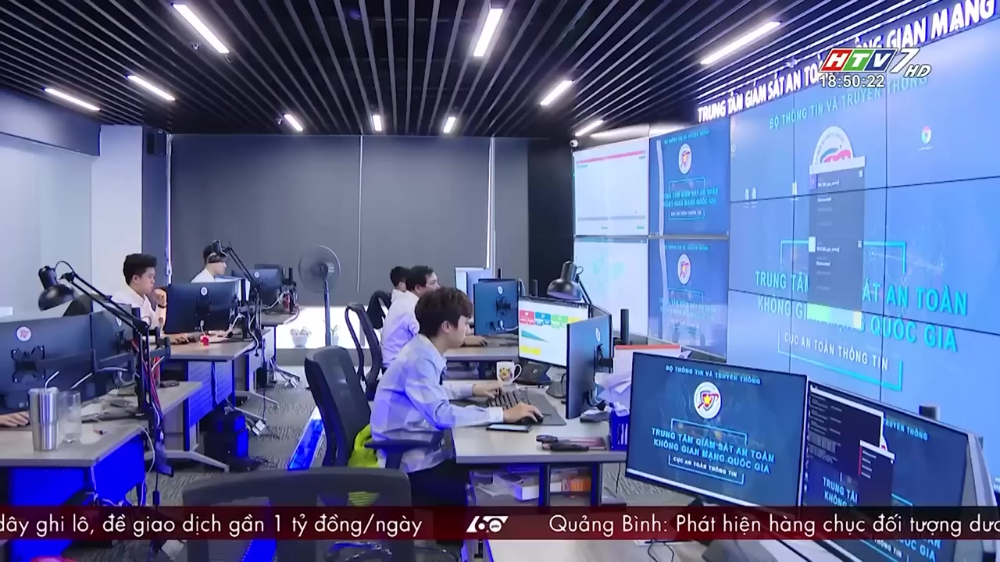

Rank 18: Folder 'L07_V020', Image '256' with similarity score 0.2726


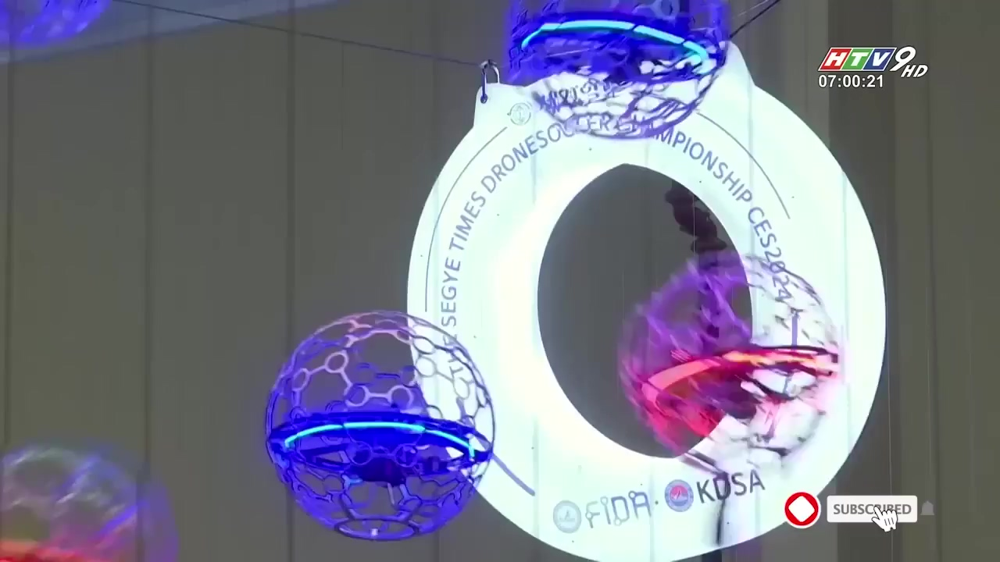

Rank 19: Folder 'L12_V001', Image '065' with similarity score 0.2712


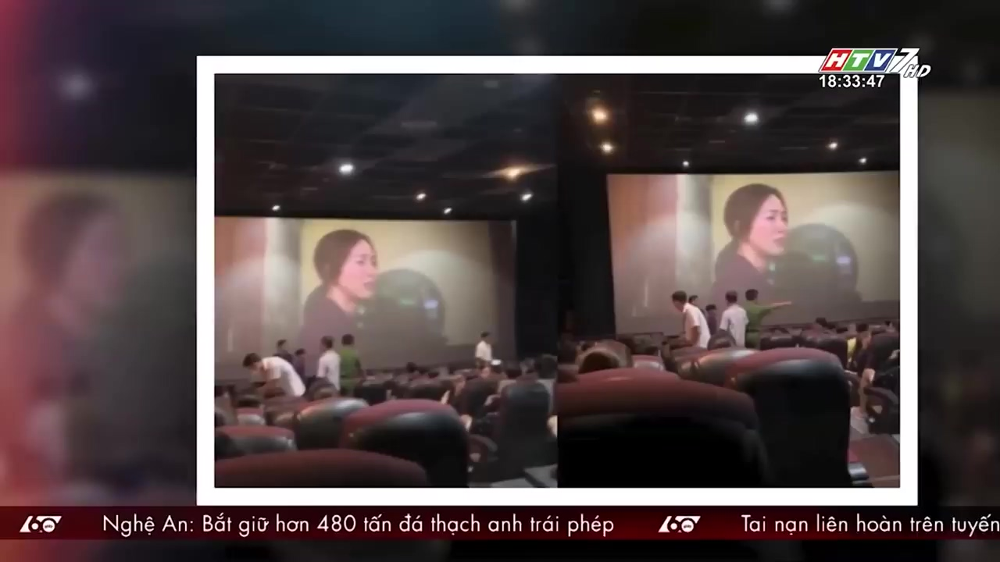

Rank 20: Folder 'L08_V022', Image '294' with similarity score 0.2710


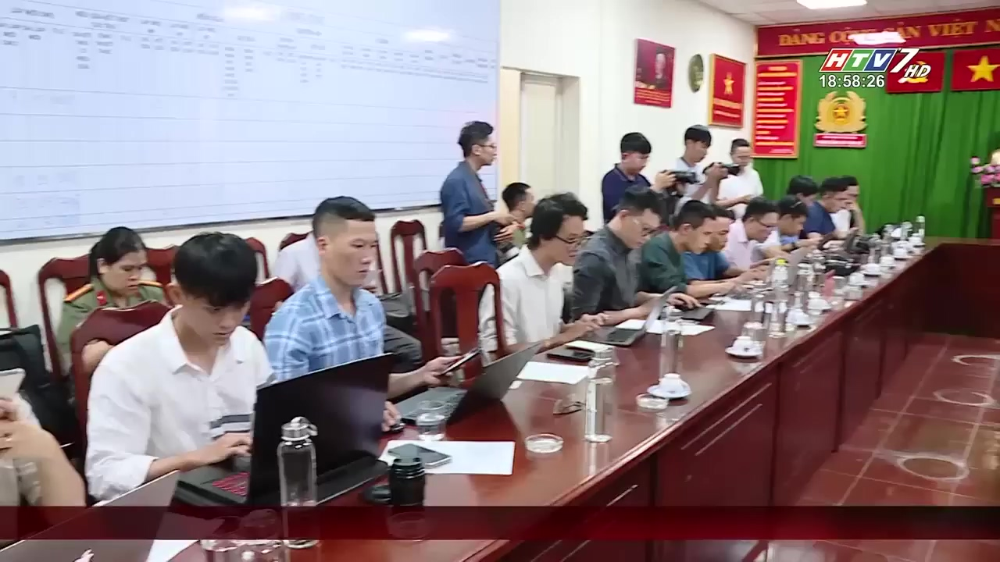

Rank 21: Folder 'L11_V026', Image '217' with similarity score 0.2708


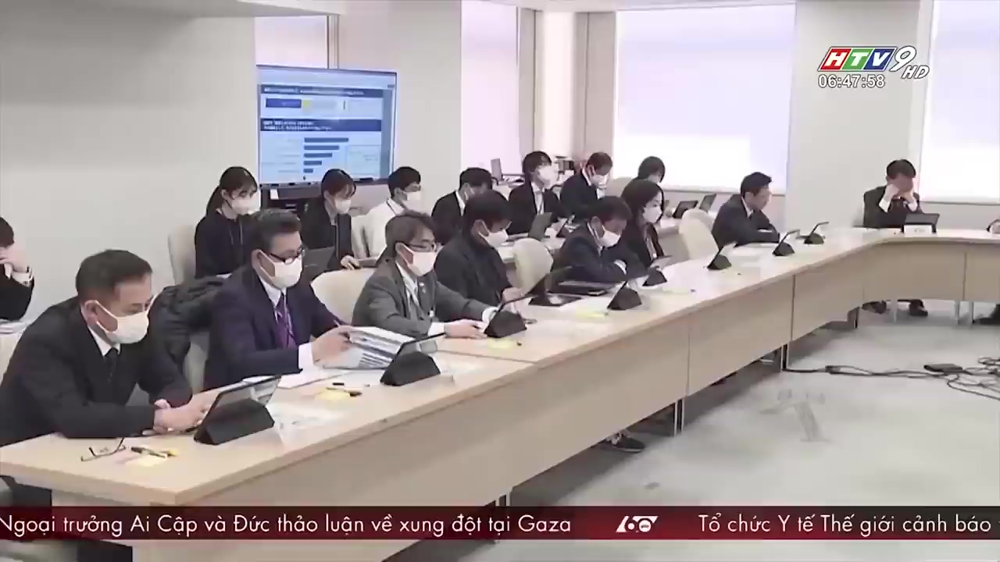

Rank 22: Folder 'L03_V005', Image '095' with similarity score 0.2707


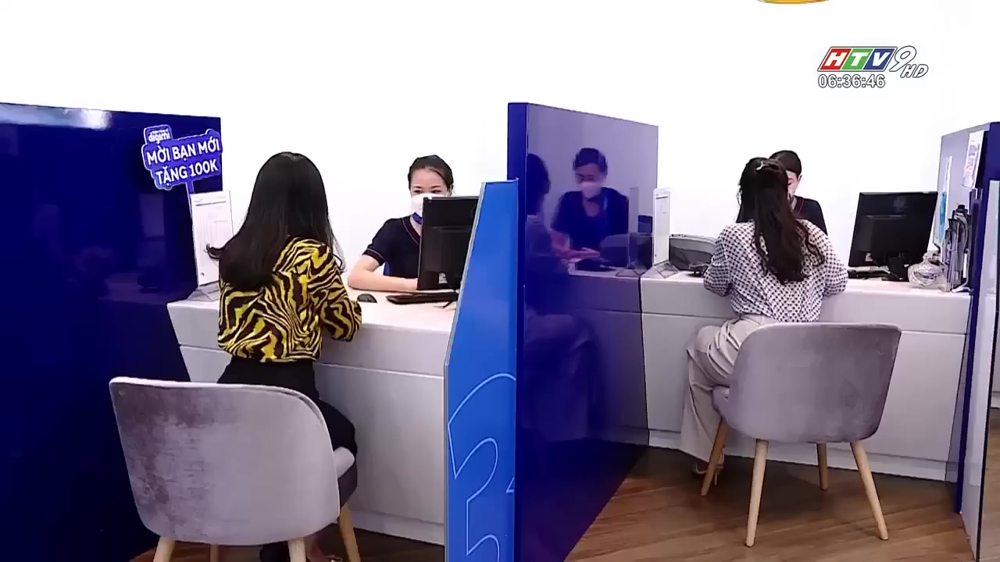

Rank 23: Folder 'L04_V002', Image '028' with similarity score 0.2700


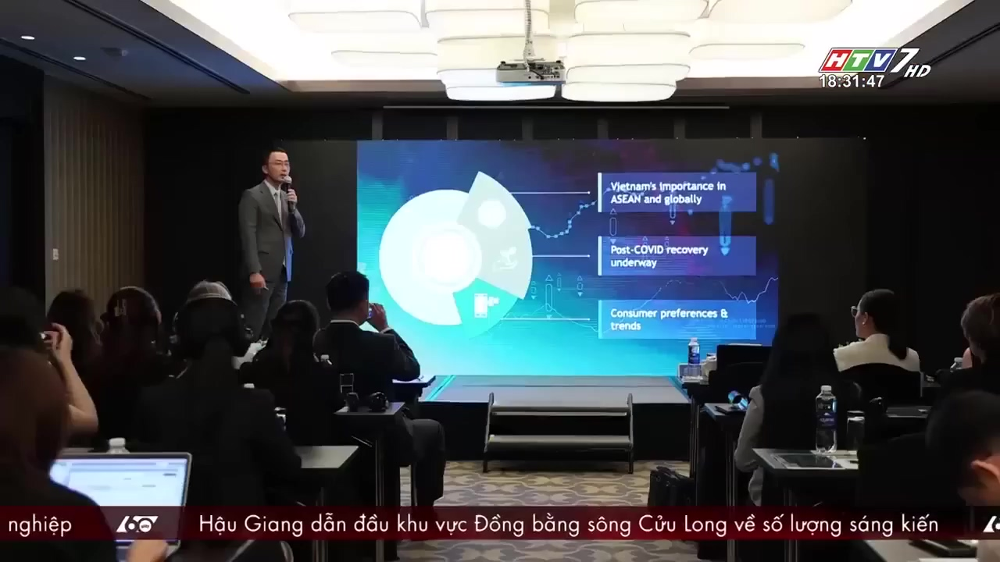

Rank 24: Folder 'L10_V010', Image '365' with similarity score 0.2687


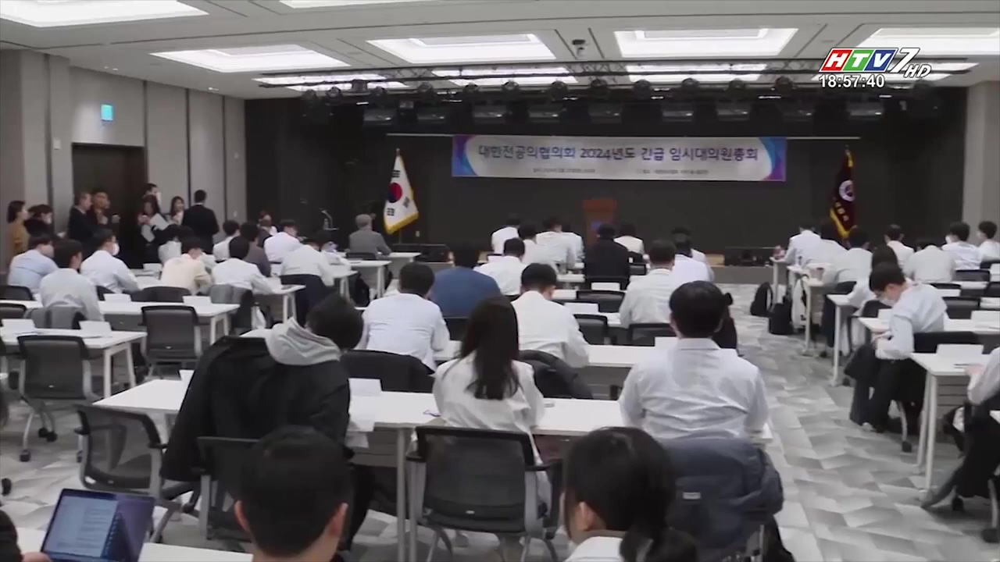

Rank 25: Folder 'L03_V029', Image '012' with similarity score 0.2675


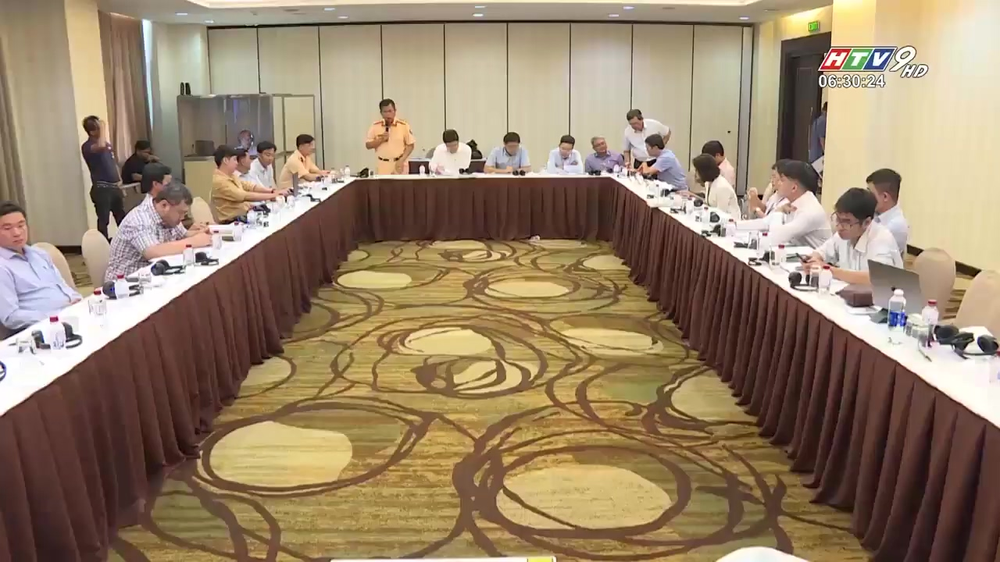

Rank 26: Folder 'L10_V010', Image '077' with similarity score 0.2667


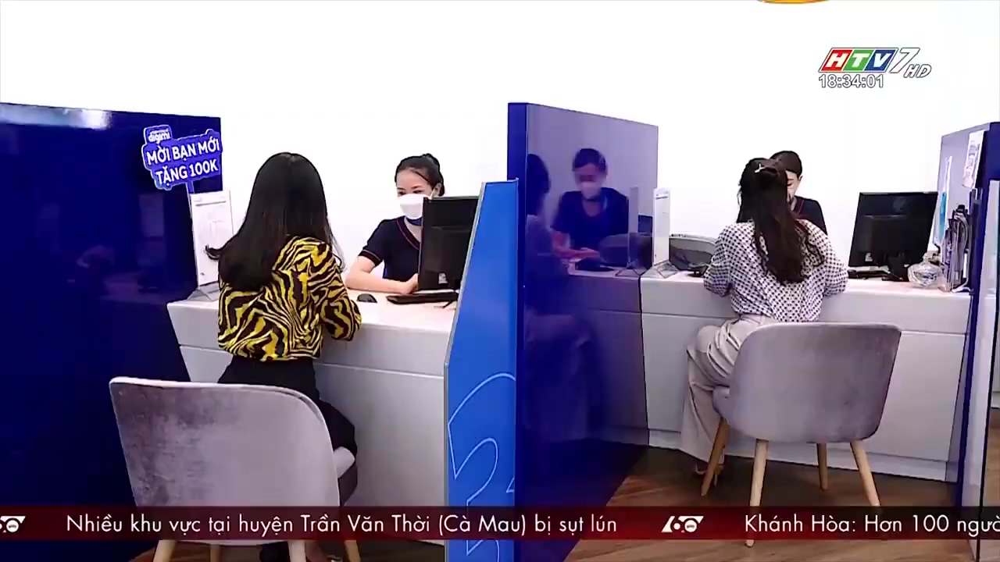

Rank 27: Folder 'L09_V010', Image '156' with similarity score 0.2651


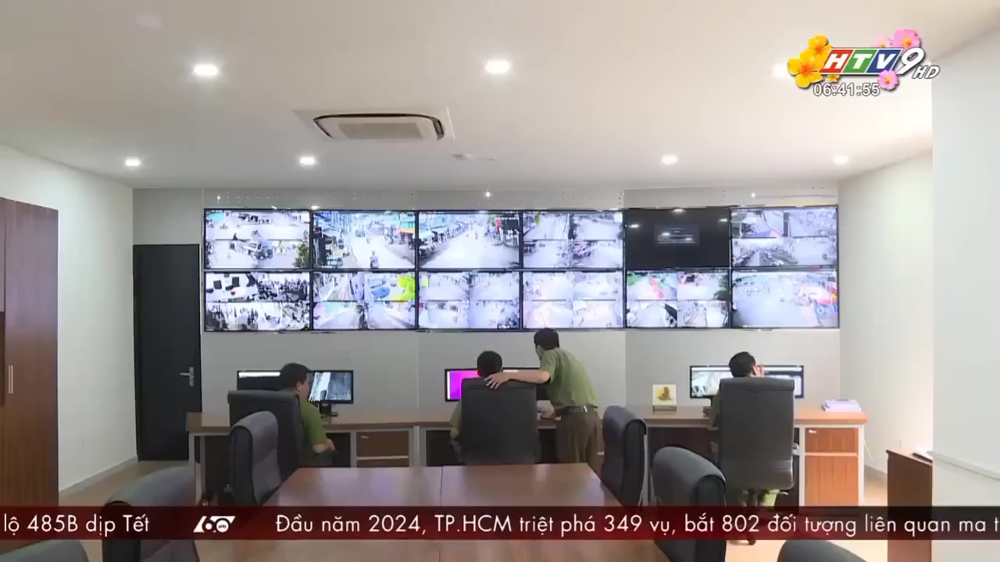

Rank 28: Folder 'L11_V003', Image '043' with similarity score 0.2646


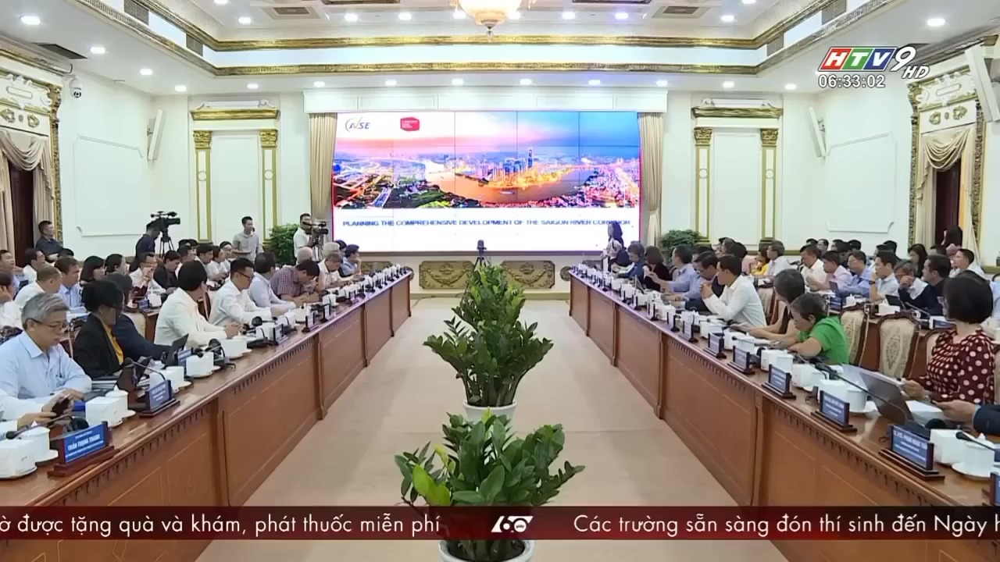

Rank 29: Folder 'L11_V009', Image '024' with similarity score 0.2645


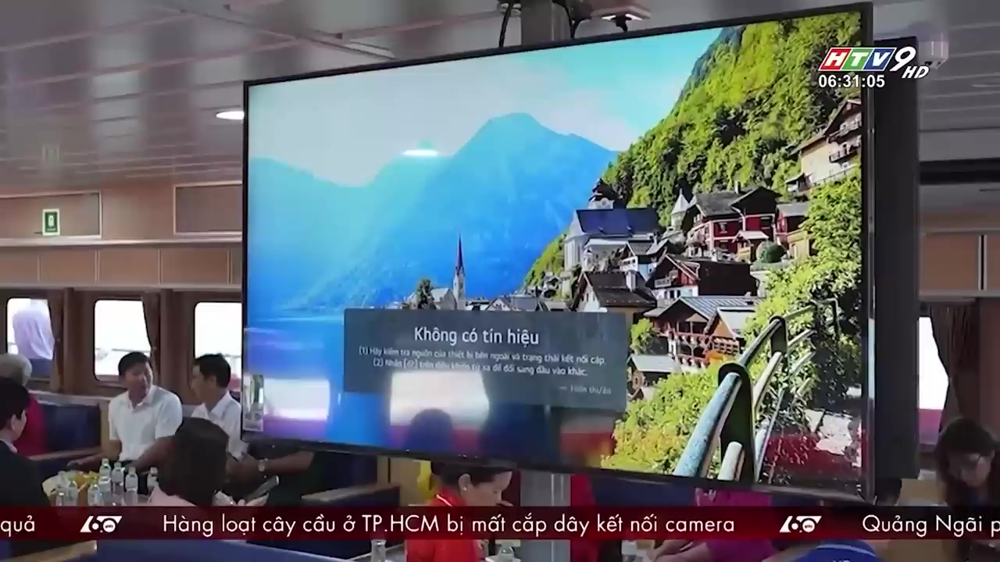

Rank 30: Folder 'L07_V013', Image '043' with similarity score 0.2638


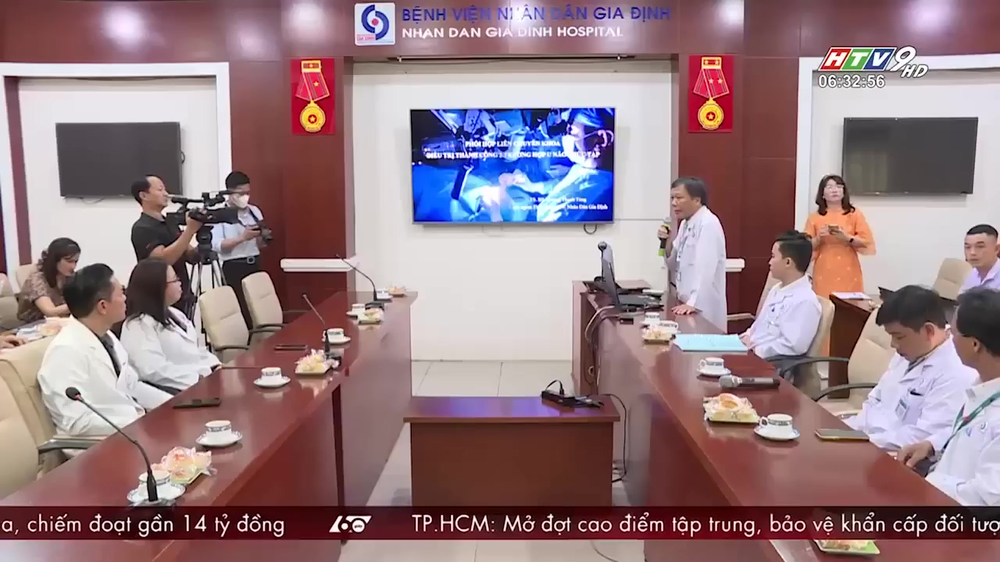

Rank 31: Folder 'L12_V001', Image '343' with similarity score 0.2628


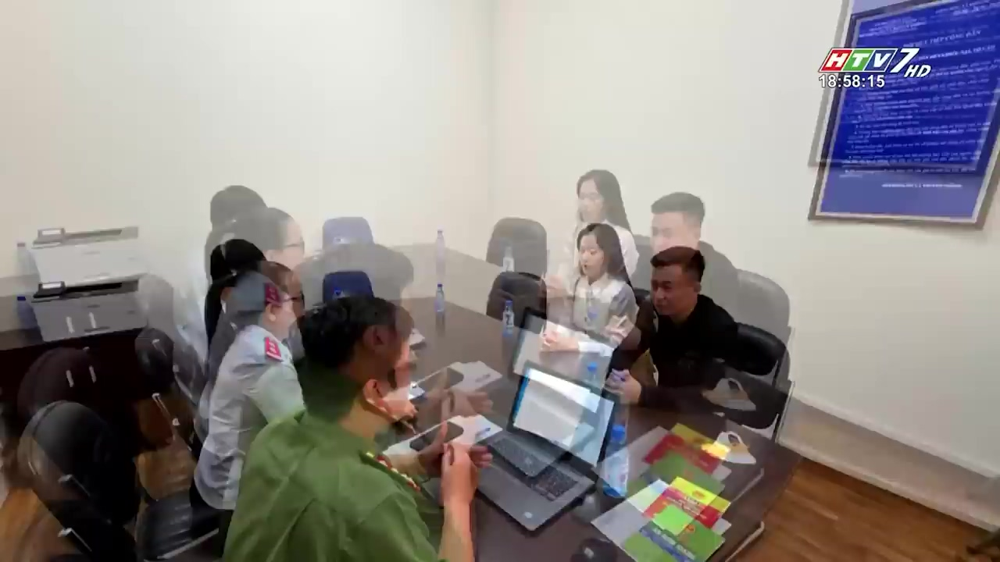

Rank 32: Folder 'L12_V021', Image '235' with similarity score 0.2625


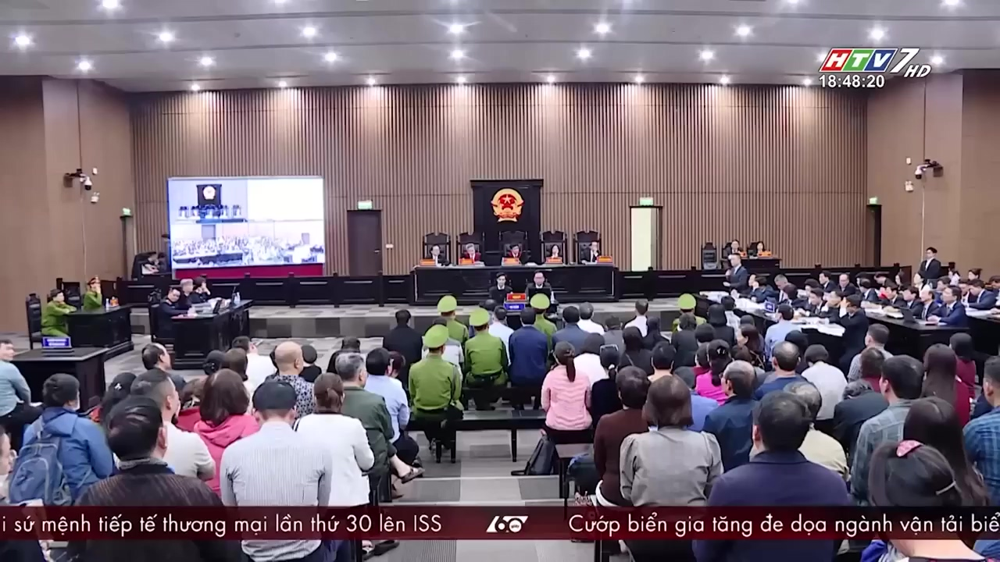

Rank 33: Folder 'L12_V001', Image '342' with similarity score 0.2622


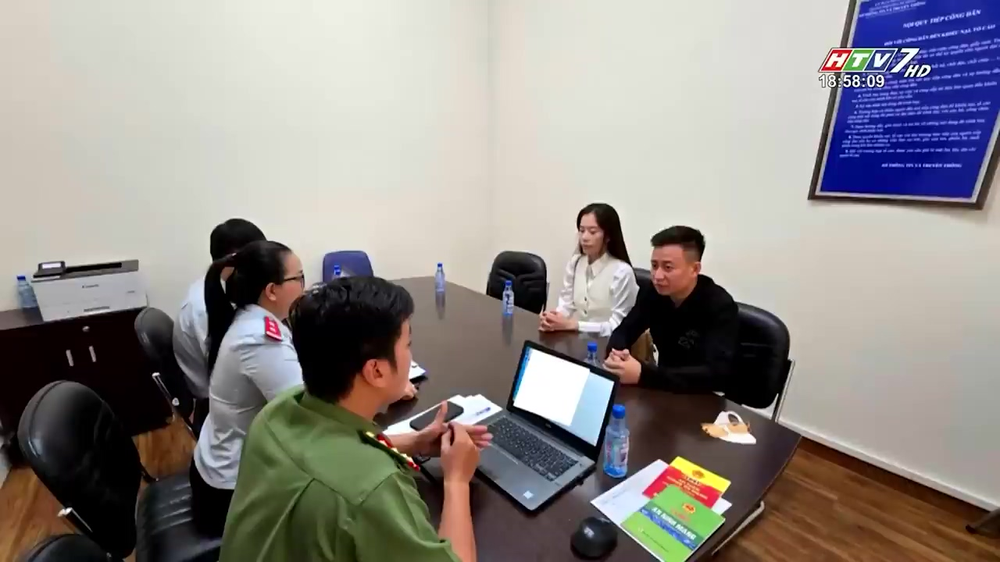

Rank 34: Folder 'L07_V022', Image '009' with similarity score 0.2618


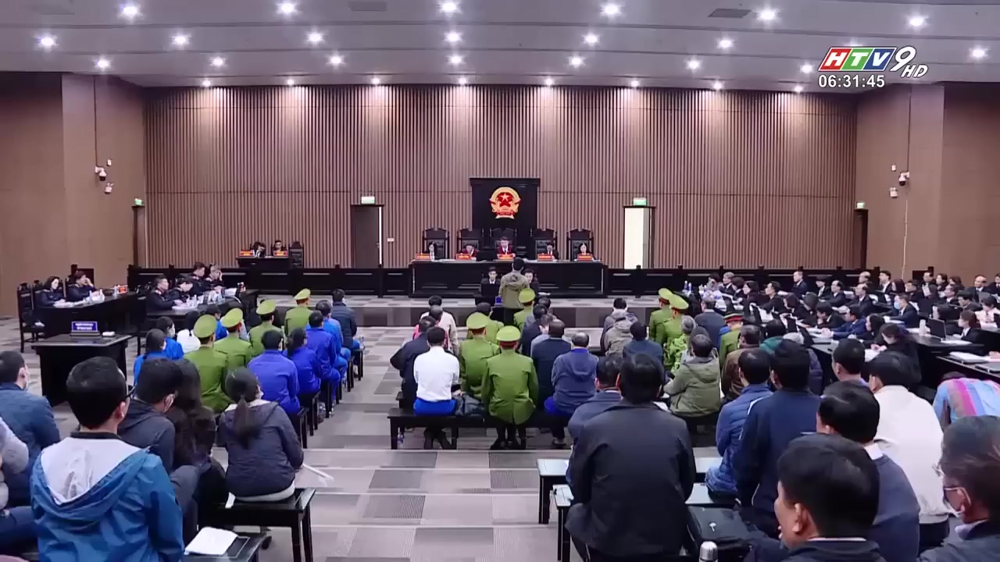

Rank 35: Folder 'L01_V006', Image '172' with similarity score 0.2618


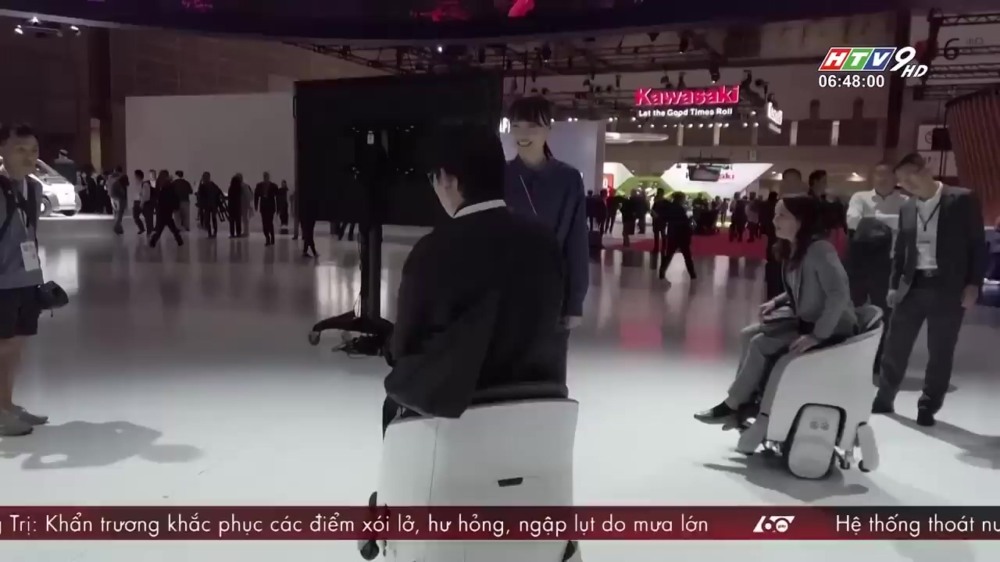

Rank 36: Folder 'L06_V006', Image '007' with similarity score 0.2616


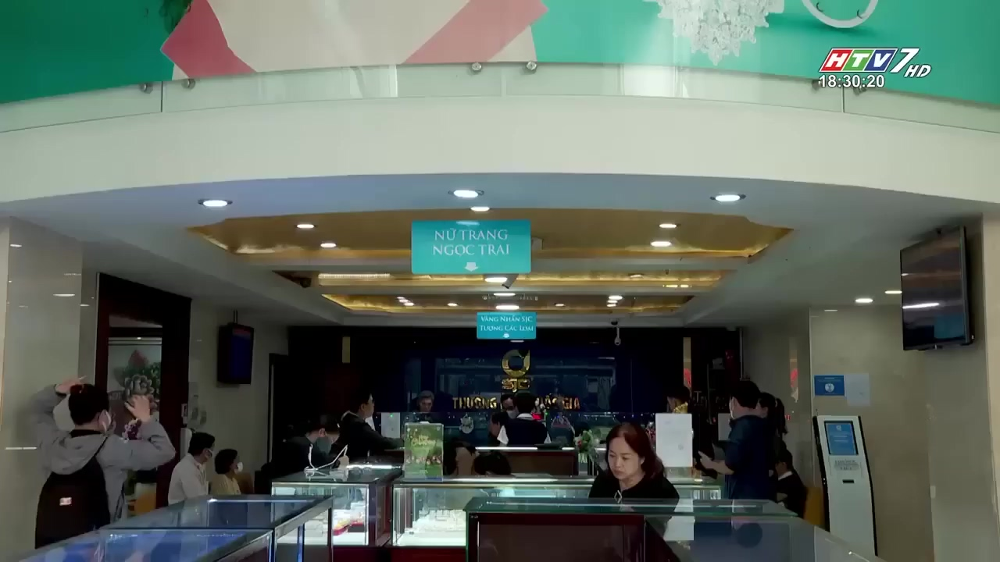

Rank 37: Folder 'L12_V001', Image '344' with similarity score 0.2611


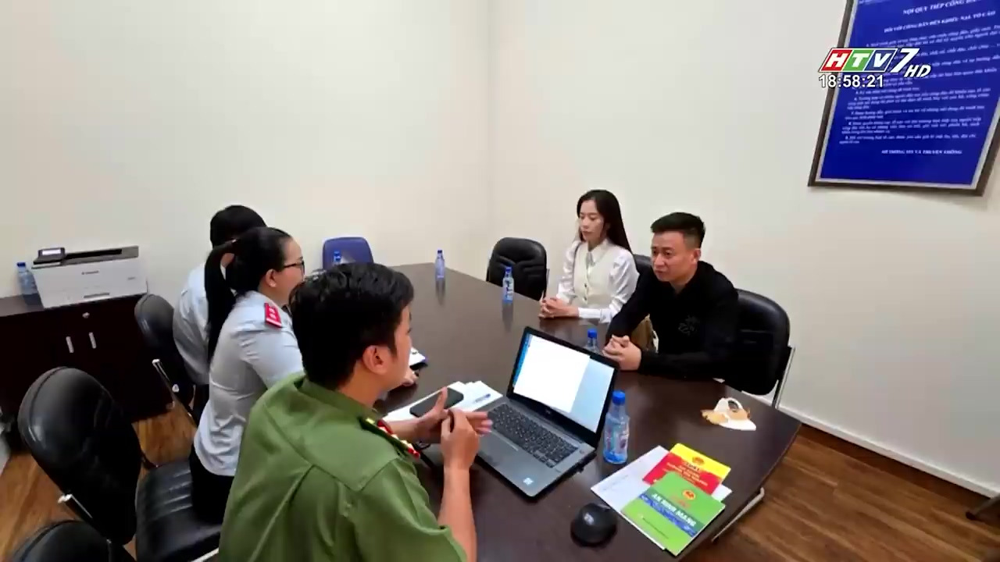

Rank 38: Folder 'L08_V001', Image '158' with similarity score 0.2610


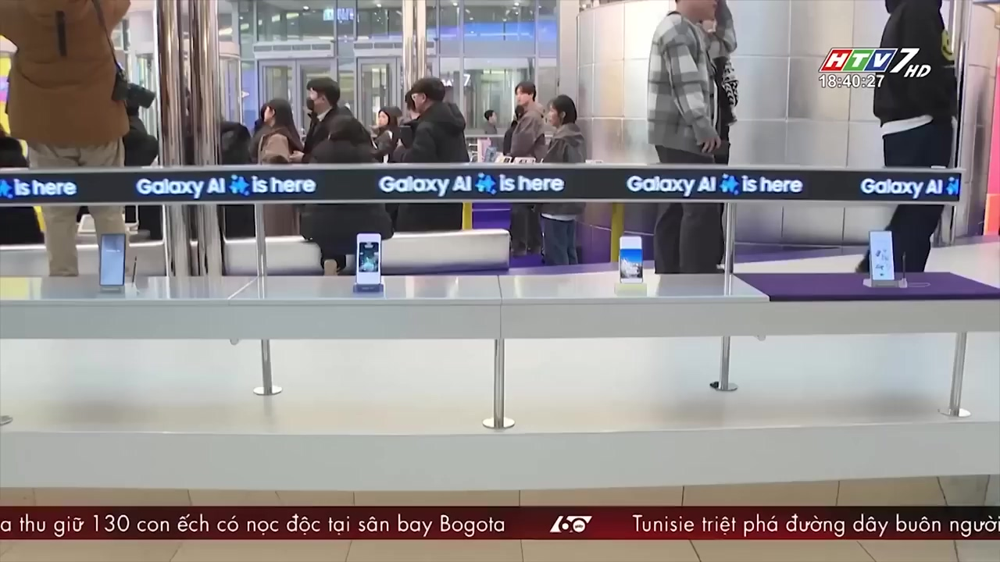

Rank 39: Folder 'L07_V020', Image '264' with similarity score 0.2610


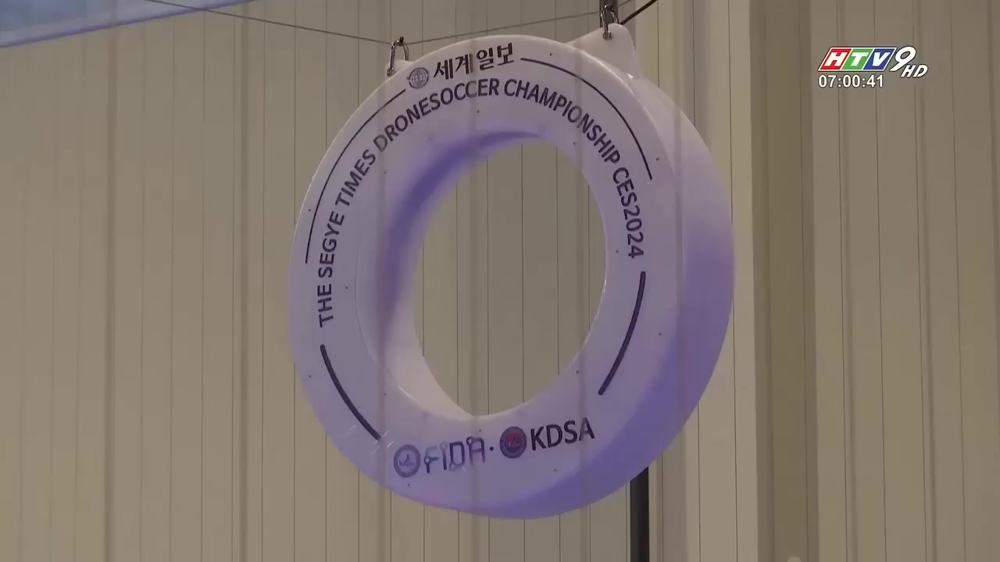

Rank 40: Folder 'L07_V013', Image '036' with similarity score 0.2610


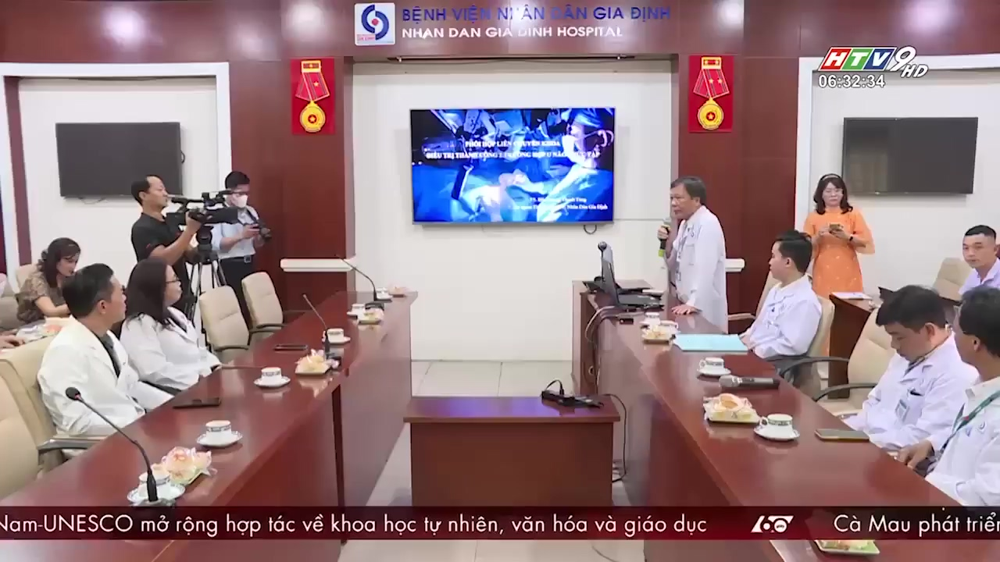

Rank 41: Folder 'L10_V007', Image '146' with similarity score 0.2607


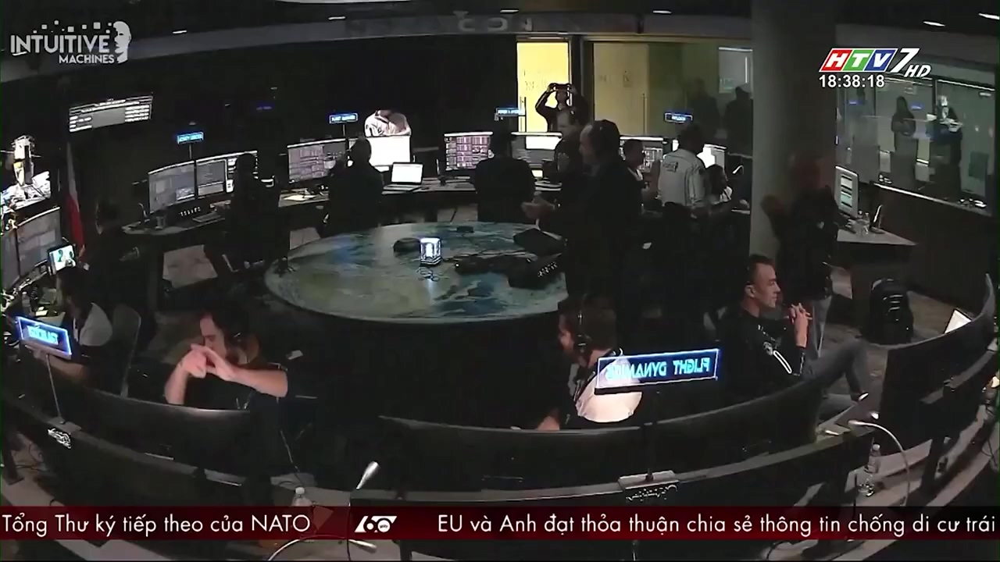

Rank 42: Folder 'L10_V007', Image '087' with similarity score 0.2607


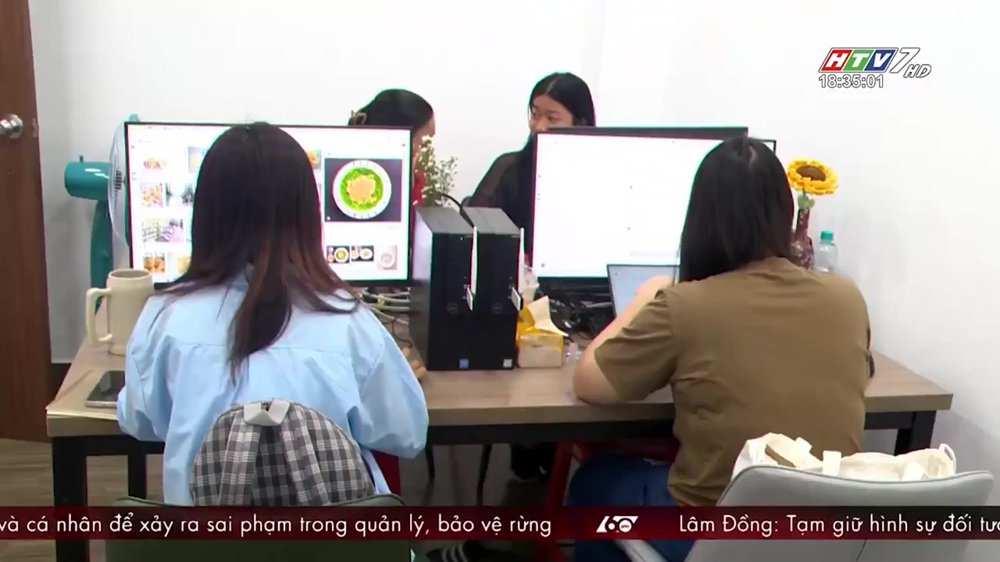

Rank 43: Folder 'L03_V029', Image '120' with similarity score 0.2607


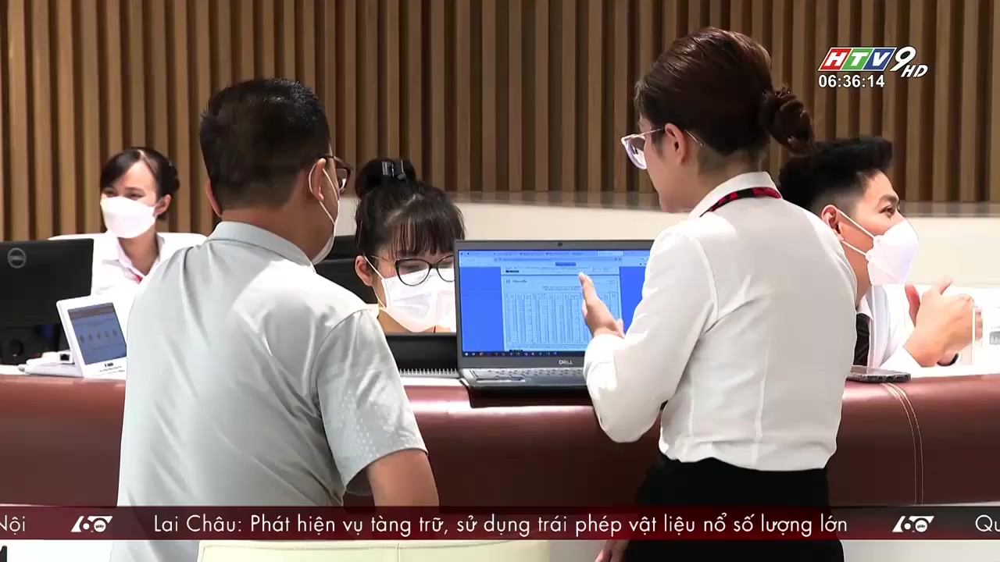

Rank 44: Folder 'L03_V010', Image '072' with similarity score 0.2606


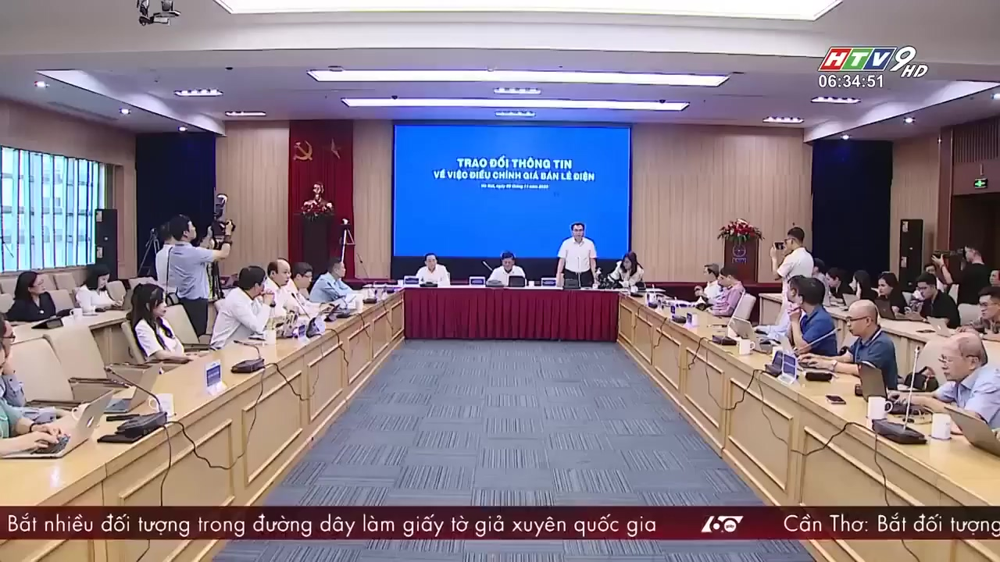

Rank 45: Folder 'L10_V008', Image '025' with similarity score 0.2606


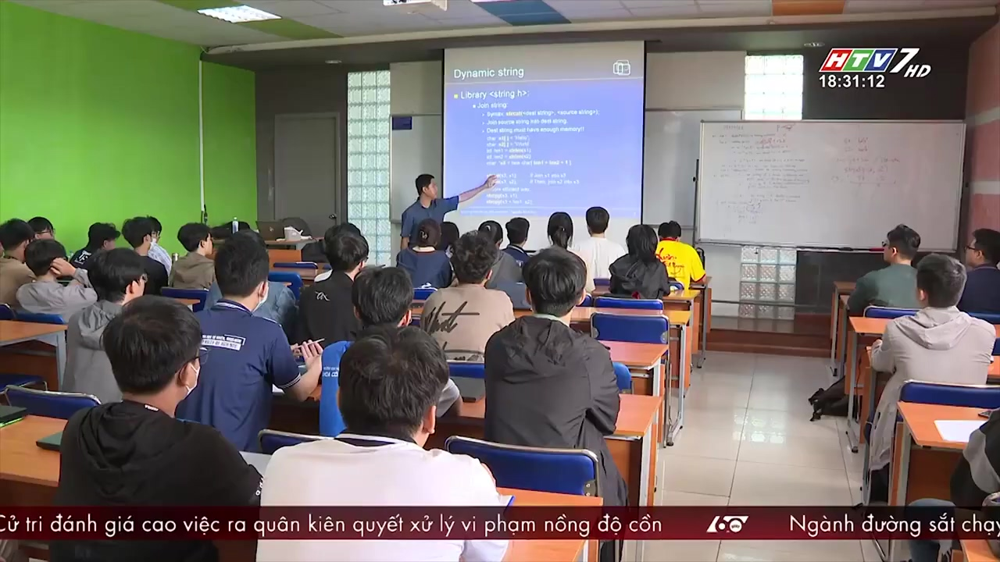

Rank 46: Folder 'L08_V023', Image '030' with similarity score 0.2603


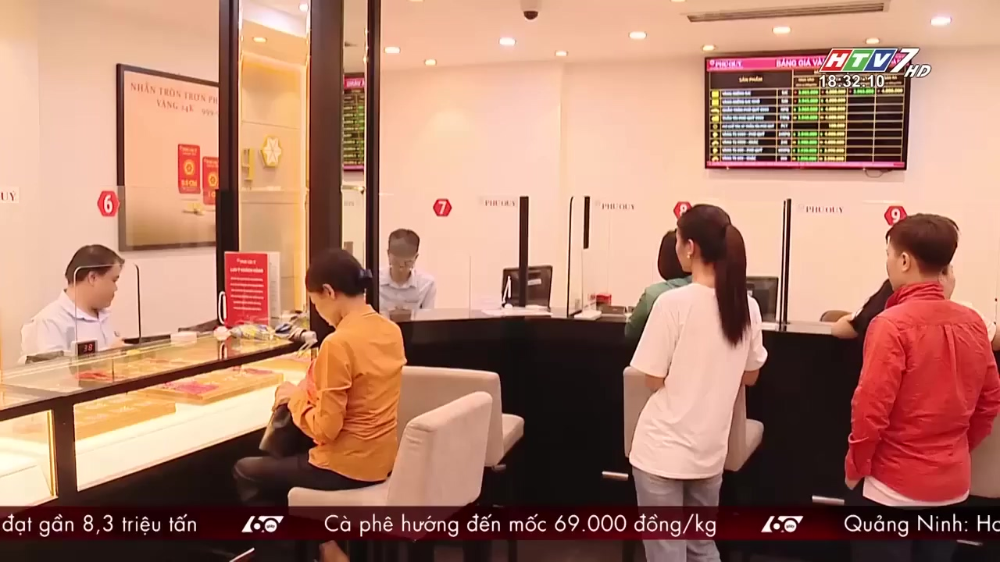

Rank 47: Folder 'L12_V002', Image '050' with similarity score 0.2596


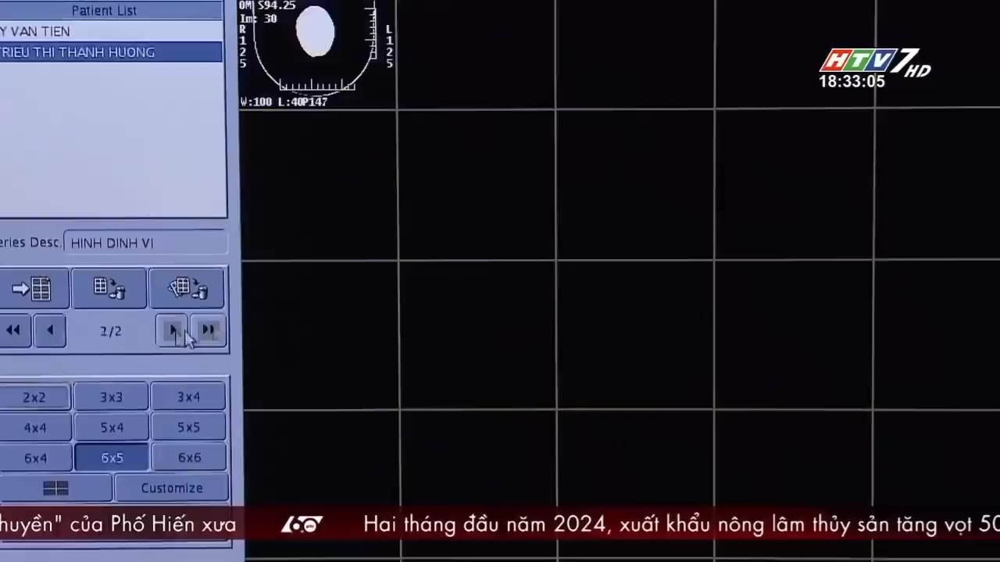

Rank 48: Folder 'L12_V007', Image '072' with similarity score 0.2592


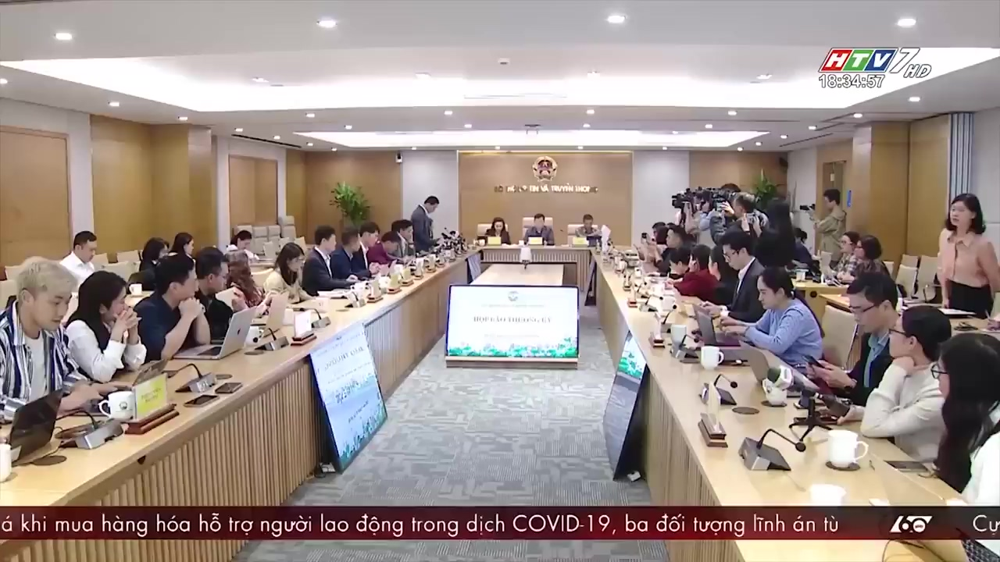

Rank 49: Folder 'L09_V024', Image '062' with similarity score 0.2588


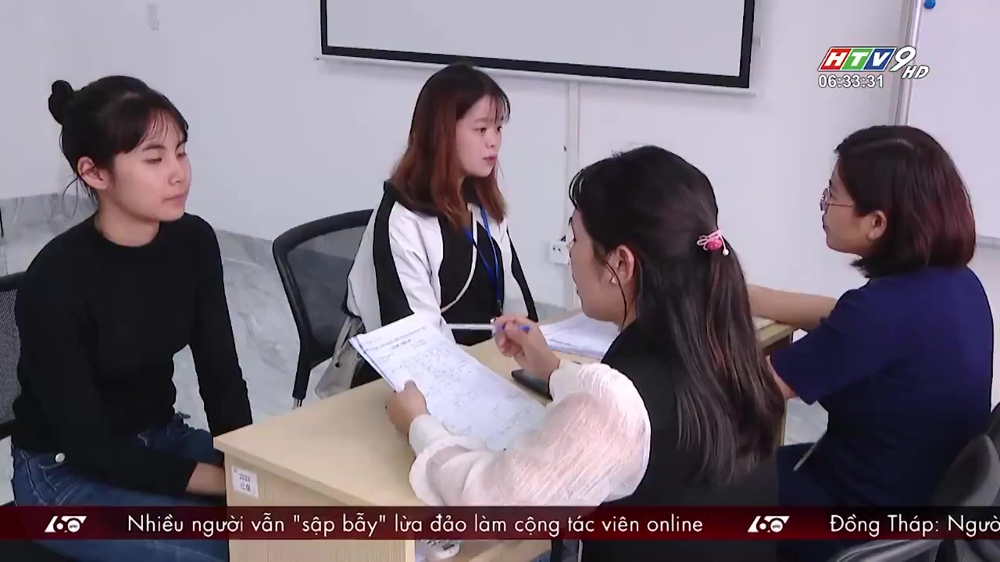

Rank 50: Folder 'L11_V004', Image '170' with similarity score 0.2587


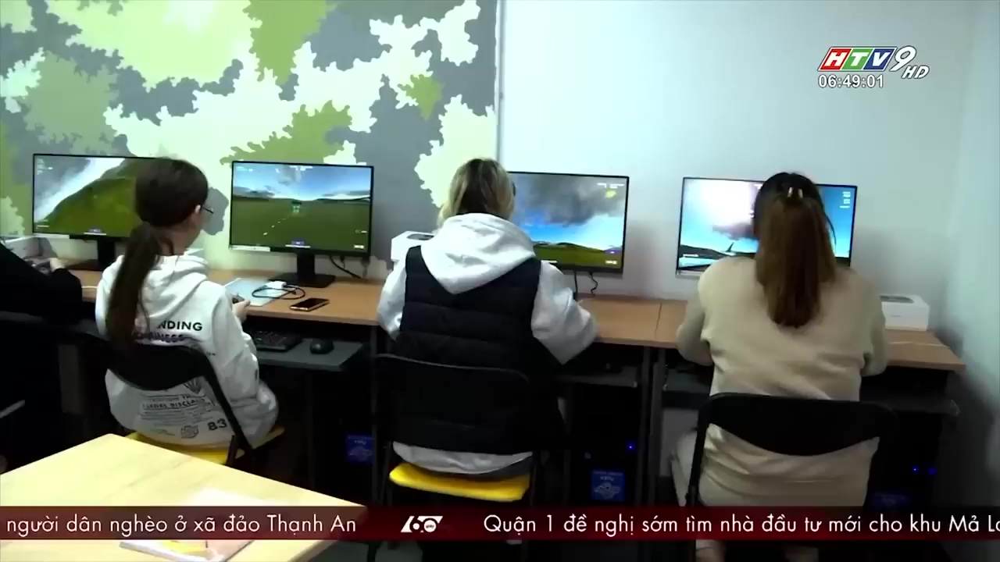

In [4]:
def text_to_features(text_list):
    inputs = processor(text=text_list, return_tensors="pt", padding=True, truncation=True)
    with torch.no_grad():
        text_features = model.get_text_features(**inputs)
    return text_features.numpy()

# Yêu cầu người dùng nhập từ khóa, phân cách bởi dấu ";"
keywords_input = input("Nhập mô tả, các mô tả phân cách bởi dấu ';': ")
keywords = [keyword.strip() for keyword in keywords_input.split(';')]

# Chuyển đổi từ khóa thành đặc trưng văn bản
text_features = text_to_features(keywords)

# Tính toán độ tương đồng cosine giữa đặc trưng văn bản và đặc trưng hình ảnh
similarities = cosine_similarity(text_features, image_features)

# Lấy chỉ số của 20 ảnh phù hợp nhất
top_indices = np.argsort(similarities[0])[::-1][:50]  #Number of priority photos shown.

# Hiển thị danh sách 50 ảnh phù hợp nhất
for i, index in enumerate(top_indices):
    folder_name, image_name = image_info[index]
    similarity_score = similarities[0][index]
    print(f"Rank {i+1}: Folder '{folder_name}', Image '{image_name}' with similarity score {similarity_score:.4f}")
    
    img_path = os.path.join(image_folder, folder_name, image_name + ".jpg")
    if os.path.exists(img_path):
        display(IPyImage(img_path))
    else:
        print(f"Image file '{img_path}' does not exist.")

TOP + AROUND (case 1)

In [ ]:
def text_to_features(text_list):
    inputs = processor(text=text_list, return_tensors="pt", padding=True, truncation=True)
    with torch.no_grad():
        text_features = model.get_text_features(**inputs)
    return text_features.numpy()

def format_image_name(number, width=3):
    """Định dạng tên ảnh để có đủ chữ số cần thiết."""
    return str(number).zfill(width)

def get_neighbor_image_names(image_name, num_neighbors=2):
    """Tìm các tên ảnh lân cận dựa trên tên ảnh hiện tại."""
    try:
        # Chuyển đổi tên ảnh sang số nguyên
        current_number = int(image_name)
    except ValueError:
        print(f"Cannot convert image name '{image_name}' to an integer.")
        return []

    # Tạo danh sách các tên ảnh lân cận
    neighbors = []
    for i in range(-num_neighbors, num_neighbors + 1):
        if i == 0:
            continue  # Bỏ qua ảnh hiện tại
        neighbor_number = current_number + i
        # Chuyển đổi lại sang tên ảnh và thêm vào danh sách
        neighbor_name = format_image_name(neighbor_number)
        neighbors.append(neighbor_name)

    return neighbors

# Yêu cầu người dùng nhập từ khóa, phân cách bởi dấu ";"
keywords_input = input("Nhập các từ khóa, phân cách bởi dấu ';': ").strip()
if not keywords_input:
    print("Không có từ khóa nào được nhập. Vui lòng thử lại.")
    exit()

keywords = [keyword.strip() for keyword in keywords_input.split(';') if keyword.strip()]

if not keywords:
    print("Không có từ khóa hợp lệ nào. Vui lòng thử lại.")
    exit()

# Chuyển đổi từ khóa thành đặc trưng văn bản
text_features = text_to_features(keywords)

# Tính toán độ tương đồng cosine giữa đặc trưng văn bản và đặc trưng hình ảnh
similarities = cosine_similarity(text_features, image_features)

# Lấy chỉ số của 50 ảnh phù hợp nhất
top_indices = np.argsort(similarities[0])[::-1][:10]

# Hiển thị danh sách ảnh phù hợp nhất và ảnh xung quanh chúng
total_images = len(image_info)
for i, index in enumerate(top_indices):
    # Hiển thị ảnh ưu tiên
    folder_name, image_name = image_info[index]
    similarity_score = similarities[0][index]
    print(f"Rank {i+1}: Folder '{folder_name}', Image '{image_name}' with similarity score {similarity_score:.4f}")

    img_path = os.path.join(image_folder, folder_name, image_name + ".jpg")
    if os.path.exists(img_path):
        display(IPyImage(img_path))
    else:
        print(f"Image file '{img_path}' does not exist.")
    
    # Tìm các tên ảnh lân cận
    neighbor_image_names = get_neighbor_image_names(image_name)
    for neighbor_image_name in neighbor_image_names:
        img_path = os.path.join(image_folder, folder_name, neighbor_image_name + ".jpg")
        print(f"    Nearby Image: Folder '{folder_name}', Image '{neighbor_image_name}'")

        if os.path.exists(img_path):
            display(IPyImage(img_path))
        else:
            print(f"Image file '{img_path}' does not exist.")

TOP + AROUND (case 2)

In [7]:
def text_to_features(text_list):
    """Chuyển đổi danh sách văn bản thành đặc trưng văn bản."""
    inputs = processor(text=text_list, return_tensors="pt", padding=True, truncation=True).to(device)
    with torch.no_grad():
        text_features = model.get_text_features(**inputs)
    return text_features.cpu().numpy()

def format_image_name(number, width=3):
    """Định dạng tên ảnh để có đủ chữ số cần thiết."""
    return str(number).zfill(width)

def get_neighbor_image_names(image_name, num_neighbors=2):
    """Tìm các tên ảnh lân cận dựa trên tên ảnh hiện tại."""
    try:
        # Chuyển đổi tên ảnh sang số nguyên
        current_number = int(image_name)
    except ValueError:
        print(f"Cannot convert image name '{image_name}' to an integer.")
        return []

    # Tạo danh sách các tên ảnh lân cận
    neighbors = []
    for i in range(-num_neighbors, num_neighbors + 1):
        if i == 0:
            continue  # Bỏ qua ảnh hiện tại
        neighbor_number = current_number + i
        # Chuyển đổi lại sang tên ảnh và thêm vào danh sách
        neighbor_name = format_image_name(neighbor_number)
        neighbors.append(neighbor_name)

    return neighbors

# Yêu cầu người dùng nhập từ khóa, phân cách bởi dấu ";"
keywords_input = input("Nhập các từ khóa, phân cách bởi dấu ';': ").strip()
if not keywords_input:
    print("Không có từ khóa nào được nhập. Vui lòng thử lại.")
    exit()

keywords = [keyword.strip() for keyword in keywords_input.split(';') if keyword.strip()]

if not keywords:
    print("Không có từ khóa hợp lệ nào. Vui lòng thử lại.")
    exit()

# Chuyển đổi từ khóa thành đặc trưng văn bản
text_features = text_to_features(keywords)

# Tính toán độ tương đồng cosine giữa đặc trưng văn bản và đặc trưng hình ảnh
similarities = cosine_similarity(text_features, image_features)

# Lấy chỉ số của 50 ảnh phù hợp nhất
top_indices = np.argsort(similarities[0])[::-1][:20]

# Hiển thị danh sách ảnh phù hợp nhất và ảnh xung quanh chúng
total_images = len(image_info)
for i, index in enumerate(top_indices):
    # Lấy thông tin của ảnh ưu tiên
    folder_name, image_name = image_info[index]
    
    # Tìm các tên ảnh lân cận
    neighbor_image_names = get_neighbor_image_names(image_name)

    # Hiển thị 2 ảnh lân cận trước
    for neighbor_image_name in neighbor_image_names[:2]:
        img_path = os.path.join(image_folder, folder_name, neighbor_image_name + ".jpg")
        print(f"    Nearby Image: Folder '{folder_name}', Image '{neighbor_image_name}'")
        if os.path.exists(img_path):
            display(IPyImage(img_path))
        else:
            print(f"Image file '{img_path}' does not exist.")

    # Hiển thị ảnh ưu tiên
    similarity_score = similarities[0][index]
    print(f"Rank {i+1}: Folder '{folder_name}', Image '{image_name}' with similarity score {similarity_score:.4f}")

    img_path = os.path.join(image_folder, folder_name, image_name + ".jpg")
    if os.path.exists(img_path):
        display(IPyImage(img_path))
    else:
        print(f"Image file '{img_path}' does not exist.")

    # Hiển thị 2 ảnh lân cận sau
    for neighbor_image_name in neighbor_image_names[2:]:
        img_path = os.path.join(image_folder, folder_name, neighbor_image_name + ".jpg")
        print(f"    Nearby Image: Folder '{folder_name}', Image '{neighbor_image_name}'")
        if os.path.exists(img_path):
            display(IPyImage(img_path))
        else:
            print(f"Image file '{img_path}' does not exist.")

2. Dot Product

In [ ]:
def text_to_features(text_list):
    inputs = processor(text=text_list, return_tensors="pt", padding=True, truncation=True)
    with torch.no_grad():
        text_features = model.get_text_features(**inputs)
    return text_features.numpy()

def dot_product(vectors_a, vectors_b):
    # Tính toán Dot Product giữa từng vector văn bản và tất cả vector hình ảnh
    return np.dot(vectors_a, vectors_b.T)

# Yêu cầu người dùng nhập từ khóa, phân cách bởi dấu ";"
keywords_input = input("Nhập các từ khóa, phân cách bởi dấu ';': ").strip()

if not keywords_input:
    print("Bạn phải nhập ít nhất một từ khóa!")
else:
    keywords = [keyword.strip() for keyword in keywords_input.split(';')]

    # Chuyển đổi từ khóa thành đặc trưng văn bản
    text_features = text_to_features(keywords)

    # Tính toán độ tương đồng Dot Product giữa đặc trưng văn bản và đặc trưng hình ảnh
    dot_similarities = dot_product(text_features, image_features)

    # Lấy chỉ số của 50 ảnh phù hợp nhất
    top_indices = np.argsort(dot_similarities[0])[::-1][:50]

    # Hiển thị danh sách 50 ảnh phù hợp nhất
    missing_images = []  # Danh sách các ảnh bị thiếu
    for i, index in enumerate(top_indices):
        folder_name, image_name = image_info[index]
        similarity_score = dot_similarities[0][index]
        print(f"Rank {i+1}: Folder '{folder_name}', Image '{image_name}' with dot product score {similarity_score:.4f}")
        
        img_path = os.path.join(image_folder, folder_name, image_name + ".jpg")
        if os.path.exists(img_path):
            display(IPyImage(img_path))
        else:
            print(f"Image file '{img_path}' does not exist.")
            missing_images.append(img_path)

    if missing_images:
        print("\nDanh sách các ảnh bị thiếu:")
        for img in missing_images:
            print(img)